<a href="https://colab.research.google.com/github/rae-fahrenholtz/spotify-genres/blob/main/spotify_genres.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Focus 

Using unsupervised learning techniques, I will predict genre labels for songs given 8 features
- acousticness
- danceability
- energy
- instrumentalness
- liveness
- speechiness
- tempo 
- valence

Unlike the real world, I precursively know that there are six balanced genres
- Rock
- Hip-Hop
- Electronic
- Old-Time / Historic
- Folk
- Pop

The size of the data set is 1800

## Where did this data come from?

- audio features provided by Echonest (now Spotify) for a subset of 13,129 

##Documentation

- github: https://github.com/mdeff/fma
- usage.ipynb: https://nbviewer.org/github/mdeff/fma/blob/outputs/usage.ipynb

## Loading Data

- utils.py into files on colab
- mount google drive
- import data from links on my personal drive

In [ ]:
#packages
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import seaborn as sns
from google.colab import files #used to save plots locally

#plt.rcParams['figure.figsize'] = (17, 5)

In [ ]:
!pip install python-dotenv

In [ ]:
from dotenv import load_dotenv

In [ ]:
import utils

In [ ]:
echonest = utils.load('drive/MyDrive/Data_Science_Bootcamp/capstone3/echonest.csv')

In [ ]:
tracks = utils.load('drive/MyDrive/Data_Science_Bootcamp/capstone3/tracks.csv')

In [ ]:
#genres = utils.load('drive/MyDrive/Data_Science_Bootcamp/capstone3/genres.csv')

## Initial Data Explore

In [ ]:
echonest.shape, tracks.shape

((13129, 249), (106574, 52))

In [ ]:
tracks[('track','genre_top')].head()

track_id
2     Hip-Hop
3     Hip-Hop
5     Hip-Hop
10        Pop
20        NaN
Name: (track, genre_top), dtype: category
Categories (16, object): ['Blues', 'Classical', 'Country', 'Easy Listening', ..., 'Pop', 'Rock',
                          'Soul-RnB', 'Spoken']

In [ ]:
tracks[('track','genre_top')].unique()

['Hip-Hop', 'Pop', NaN, 'Rock', 'Experimental', ..., 'Country', 'Classical', 'Old-Time / Historic', 'Instrumental', 'Easy Listening']
Length: 17
Categories (16, object): ['Hip-Hop', 'Pop', 'Rock', 'Experimental', ..., 'Classical',
                          'Old-Time / Historic', 'Instrumental', 'Easy Listening']

## Getting the features I want

I want:
- audio_features from echonest
- top_genre from tracks

In [ ]:
merged_df = tracks['track'].join(echonest['echonest', 'audio_features'])

In [ ]:
# columns of interest
my_df = merged_df[["genre_top", "genres", 'genres_all', 'acousticness','danceability', 'energy', 'instrumentalness', 'liveness','speechiness','tempo','valence']]

In [ ]:
# drop rows with missing values for all echonest features
my_df_mod = my_df.dropna(how = 'all', 
                         subset=[
                                 'acousticness', 'danceability','energy',
                                 'instrumentalness','liveness','speechiness',
                                 'tempo','valence'])

In [ ]:
my_df_mod.shape

(13129, 11)

In [ ]:
my_df_mod.head()

,genre_top,genres,genres_all,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence
track_id,,,,,,,,,,,
2,Hip-Hop,[21],[21],0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922,0.576661
3,Hip-Hop,[21],[21],0.374408,0.528643,0.817461,0.001851,0.105880,0.461818,126.957,0.269240
5,Hip-Hop,[21],[21],0.043567,0.745566,0.701470,0.000697,0.373143,0.124595,100.260,0.621661
10,Pop,[10],[10],0.951670,0.658179,0.924525,0.965427,0.115474,0.032985,111.562,0.963590
134,Hip-Hop,[21],[21],0.452217,0.513238,0.560410,0.019443,0.096567,0.525519,114.290,0.894072


In [ ]:
# top genres
my_df_mod.groupby('genre_top')['genre_top'].count().sort_values(ascending=False)

genre_top
Rock                   3892
Electronic             2170
Hip-Hop                 910
Folk                    874
Old-Time / Historic     357
Pop                     346
Classical               265
Jazz                    241
International           133
Instrumental             84
Blues                    66
Experimental             17
Spoken                    0
Soul-RnB                  0
Easy Listening            0
Country                   0
Name: genre_top, dtype: int64

## Creating balanced groups for top 6 genres


In [ ]:
genre1 = my_df_mod['genre_top'] == 'Rock'
genre2 = my_df_mod['genre_top'] == 'Electronic'
genre3 = my_df_mod['genre_top'] == 'Hip-Hop'
genre4 = my_df_mod['genre_top'] == 'Folk'
genre5 = my_df_mod['genre_top'] == 'Old-Time / Historic'
genre6 = my_df_mod['genre_top'] == 'Pop'

#create new data from with only top six genres
top_six_df = my_df_mod.loc[genre1 | genre2 | genre3 | genre4 | genre5 | genre6]

In [ ]:
grouped = top_six_df.groupby('genre_top', observed=True)

In [ ]:
grouped['genre_top'].count().sort_values(ascending=False)

genre_top
Rock                   3892
Electronic             2170
Hip-Hop                 910
Folk                    874
Old-Time / Historic     357
Pop                     346
Name: genre_top, dtype: int64

In [ ]:
#Get Random Sample of Size, `sample_size` for each genre
sample_size = 300
df_balanced = grouped.apply(lambda x: x.sample(sample_size, random_state=42))

In [ ]:
genres = ['Rock', 'Hip-Hop', 'Electronic', 'Old-Time / Historic', 'Folk', 'Pop']

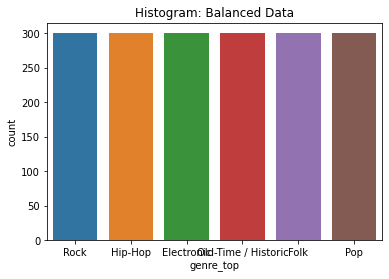

In [ ]:
sns.countplot(data=df_balanced, x='genre_top', order=genres)
plt.title('Histogram: Balanced Data')
plt.show()

In [ ]:
#rename index
df_balanced = df_balanced.reset_index('genre_top', drop=True)

#shuffle indexes
df = df_balanced.sample(frac = 1, random_state=42)

In [ ]:
df.head()

,genre_top,genres,genres_all,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence
track_id,,,,,,,,,,,
18006,Old-Time / Historic,[8],[8],0.995796,0.413948,0.137971,0.969992,0.204952,0.045937,75.516,0.325726
86799,Rock,[66],"[66, 12]",0.003667,0.270179,0.786824,0.025999,0.101354,0.031723,156.175,0.401982
3908,Folk,[17],[17],0.927899,0.197051,0.243620,0.925466,0.109807,0.036341,173.268,0.192772
15154,Hip-Hop,[21],[21],0.630249,0.595557,0.125026,0.909442,0.071097,0.102870,191.822,0.185750
66854,Electronic,"[286, 495]","[495, 286, 15]",0.282242,0.856477,0.218511,0.877532,0.113193,0.263706,87.016,0.510687


## Model Prep and Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
#Feature Columns
X = df[['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 
        'speechiness', 'tempo', 'valence']]

In [ ]:
#standardize features
X_std = StandardScaler().fit_transform(X)

In [ ]:
#use ordinal encoder for genre categories
ord_enc = OrdinalEncoder()
ord_enc.fit_transform(df[["genre_top"]])
df[["genre_top"]] = ord_enc.fit_transform(df[["genre_top"]])

Key for Ordinal Encoder:
0. Electronic
1. Folk
2. Hip-Hop
3. Old-Time / Historic
4. Pop
5. Rock


In [ ]:
y = df['genre_top'].astype(int)

In [ ]:
#pandas df to numpy series, for easier plotting
y = y.to_numpy()

## Exploritory Data Analysis (EDA)

In [ ]:
#drop unneeded columns
df_balanced = df_balanced.drop(['genres', 'genres_all'], axis=1)

In [ ]:
df_balanced.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1800 entries, 89857 to 21991
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   genre_top         1800 non-null   category
 1   acousticness      1800 non-null   float64 
 2   danceability      1800 non-null   float64 
 3   energy            1800 non-null   float64 
 4   instrumentalness  1800 non-null   float64 
 5   liveness          1800 non-null   float64 
 6   speechiness       1800 non-null   float64 
 7   tempo             1800 non-null   float64 
 8   valence           1800 non-null   float64 
dtypes: category(1), float64(8)
memory usage: 129.1 KB


In [ ]:
df_balanced.describe().round(2)

,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence
count,1800.00,1800.00,1800.00,1800.00,1800.00,1800.00,1800.00,1800.00
mean,0.60,0.50,0.46,0.61,0.22,0.12,121.17,0.47
std,0.39,0.19,0.27,0.38,0.18,0.16,36.06,0.27
min,0.00,0.05,0.00,0.00,0.03,0.02,19.66,0.00
25%,0.18,0.37,0.23,0.14,0.11,0.04,93.96,0.24
50%,0.75,0.50,0.44,0.83,0.13,0.05,118.48,0.46
75%,0.98,0.64,0.68,0.93,0.27,0.11,143.32,0.69
max,1.00,0.97,1.00,0.99,0.97,0.96,241.55,0.99


In [ ]:
numeric_columns = df_balanced.select_dtypes('float64').columns

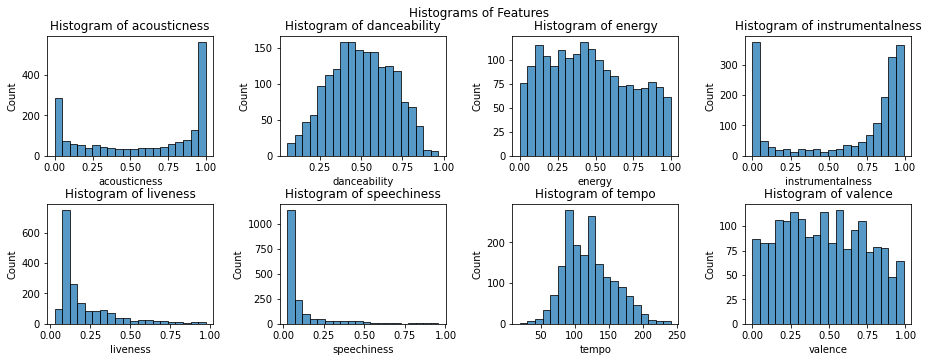

In [ ]:
#Histogram of Features
plt.figure(figsize = (15,5))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.suptitle('Histograms of Features')
for i, col in enumerate(numeric_columns):
  plt.subplot(2, 4, i+1)
  sns.histplot(data=df_balanced, x=col, bins=20)
  plt.title("Histogram of {}".format(col))
#plt.savefig('hist_features.png')
#files.download("hist_features.png") 
plt.show()

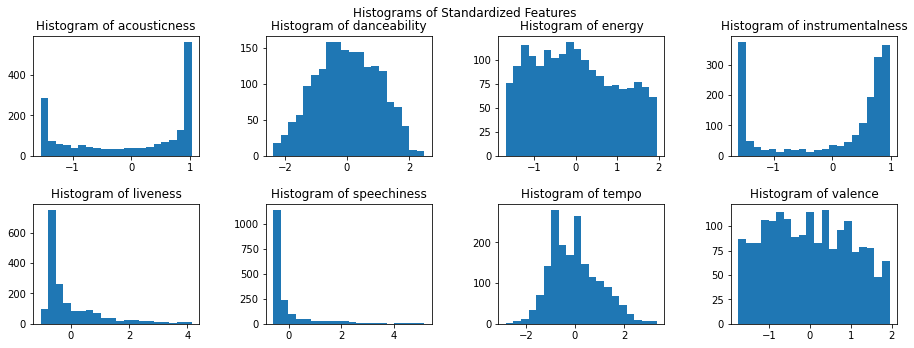

In [ ]:
#Histogram of Standardized Features
plt.figure(figsize = (15,5))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.suptitle('Histograms of Standardized Features')
for i, col in enumerate(numeric_columns):
  plt.subplot(2, 4, i+1)
  plt.hist(X_std[:,i], bins=20)
  plt.title("Histogram of {}".format(col))

#plt.savefig('hist_std_features.png')
#files.download("hist_std_features.png") 
plt.show()

In [ ]:
df_balanced.corr().round(2)

,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence
acousticness,1.00,-0.25,-0.56,0.16,0.16,0.02,-0.11,-0.05
danceability,-0.25,1.00,0.11,-0.18,-0.17,0.14,-0.06,0.42
energy,-0.56,0.11,1.00,-0.07,-0.13,0.04,0.19,0.16
instrumentalness,0.16,-0.18,-0.07,1.00,-0.05,-0.23,0.03,-0.09
liveness,0.16,-0.17,-0.13,-0.05,1.00,0.14,-0.07,0.02
speechiness,0.02,0.14,0.04,-0.23,0.14,1.00,0.02,0.13
tempo,-0.11,-0.06,0.19,0.03,-0.07,0.02,1.00,0.10
valence,-0.05,0.42,0.16,-0.09,0.02,0.13,0.10,1.00


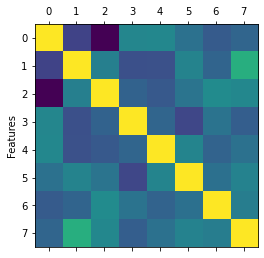

In [ ]:
plt.matshow(df_balanced.corr())
plt.ylabel('Features')
plt.show()

## Algorithms

In [ ]:
from sklearn.decomposition import PCA
from sklearn import metrics
my_random_state = 42

### K-means

In [ ]:
from sklearn.cluster import KMeans

#### Determining number of clusters

In [ ]:
adj_rand_score = []
silhouette_score = []
my_random_state = 42

for n_cluster in np.arange(2,10,1):
  kmeans_cluster = KMeans(n_clusters=n_cluster, random_state=my_random_state)
  kmeans_cluster.fit(X_std)
  y_pred = kmeans_cluster.predict(X_std)
  adj_rand_score.append(metrics.adjusted_rand_score(y, y_pred))
  silhouette_score.append(metrics.silhouette_score(X_std, y_pred))

In [ ]:
n_clusters = np.arange(2,10,1)

In [ ]:
d = {'k clusters': n_clusters, 'Adj Rand Score':adj_rand_score, 'Silhouette Score':silhouette_score}

In [ ]:
metrics_df = pd.DataFrame(d)

In [ ]:
kmeans_metrics_df = metrics_df

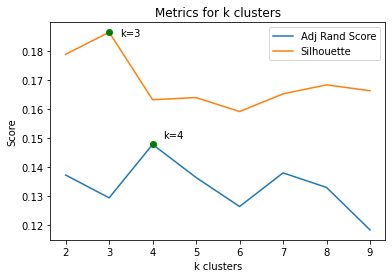

In [ ]:
sns.lineplot(data=metrics_df, x='k clusters', y='Adj Rand Score')
sns.lineplot(data=metrics_df, x='k clusters', y='Silhouette Score')
plt.plot(4, metrics_df['Adj Rand Score'][2],'o', color='g')
plt.text(4.25, .15,'k=4')
plt.plot(3, metrics_df['Silhouette Score'][1],'o', color='g')
plt.text(3.25, .185,'k=3')
plt.title('Metrics for k clusters')
plt.ylabel('Score')
plt.legend(labels=['Adj Rand Score', 'Silhouette'])
#plt.savefig('Kmeans_cluster_line.png')
#files.download("Kmeans_cluster_line.png") 
plt.show()

In [ ]:
metrics_df[metrics_df['k clusters'] == 4]

,k clusters,Adj Rand Score,Silhouette Score
2,4,0.147751,0.163144


In [ ]:
metrics_df[metrics_df['k clusters'] == 6]

,k clusters,Adj Rand Score,Silhouette Score
4,6,0.126349,0.15908


- The highest scoring K-means algorithm according to the Adjusted Random Score, is `k=4`.

- The highest scoring K-means algorithm according to the silhouette score, since we know the ground truth, is `k=3`. 

- I will compare models where `k=4`, as suggested from the Adjusted Random score, and also `k=6` since we know this is the ground truth. 

In [ ]:
#n_clusters=4
kmeans_cluster4 = KMeans(n_clusters=4, random_state=my_random_state)
kmeans_cluster4.fit(X_std)
y_pred4 = kmeans_cluster4.predict(X_std)

In [ ]:
#n_clusters=6
kmeans_cluster6 = KMeans(n_clusters=6, random_state=my_random_state)
kmeans_cluster6.fit(X_std)
y_pred6 = kmeans_cluster6.predict(X_std)

#### pca plots

In [ ]:
pca = PCA(n_components=2)

In [ ]:
pca_fit = pca.fit_transform(X_std)

In [ ]:
print('The percentage of variance explained by the first and second component is {:.2f} percent'.format(sum(pca.explained_variance_ratio_)*100))

The percentage of variance explained by the first and second component is 42.34 percent


In [ ]:
colour4 = ['r','b','g','c']

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

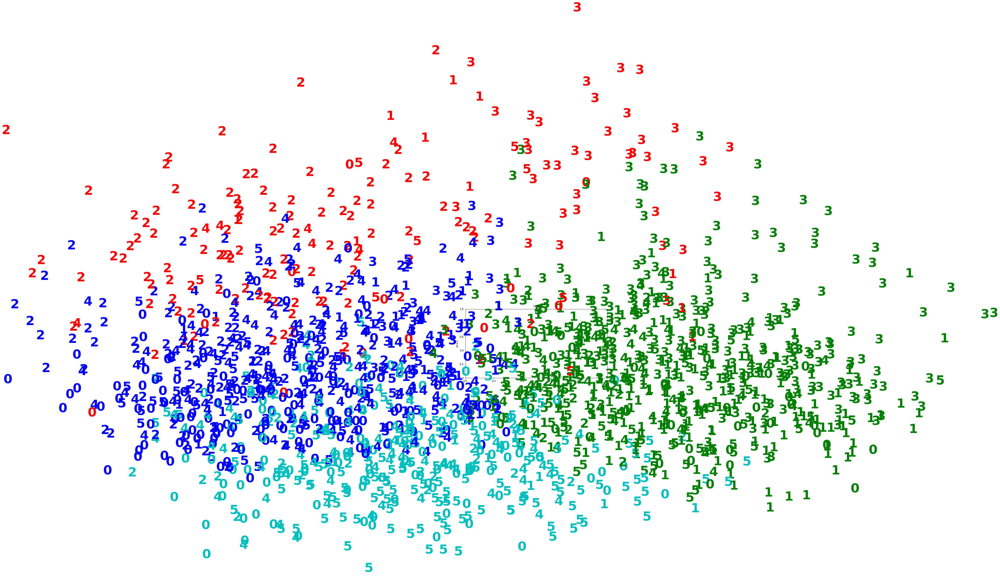

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour4[y_pred4[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.savefig('Kmeans4_pca.png')
files.download("Kmeans4_pca.png") 
#plt.show()

In [ ]:
colour6 = ["r","b","g","c","m","y"]

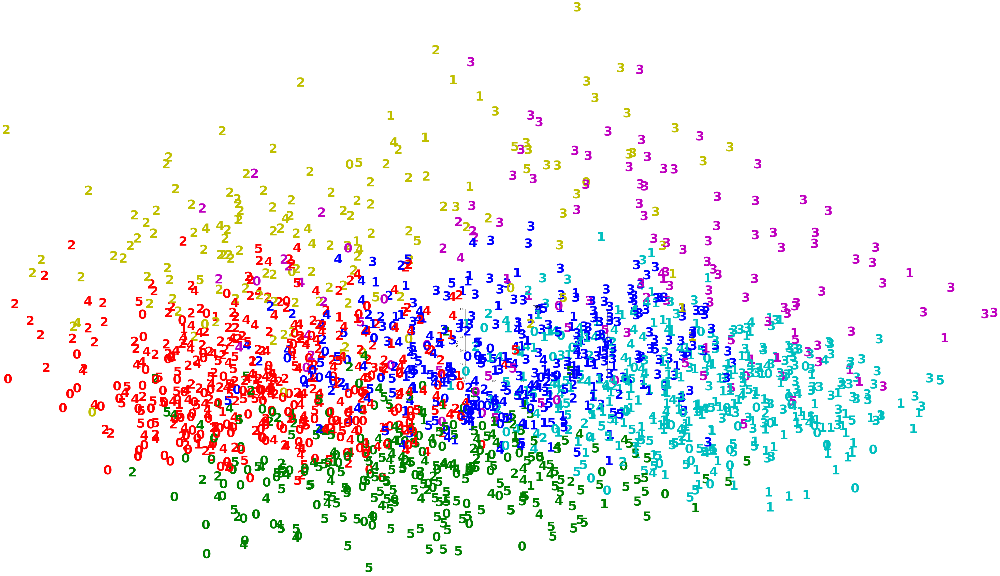

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[y_pred6[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

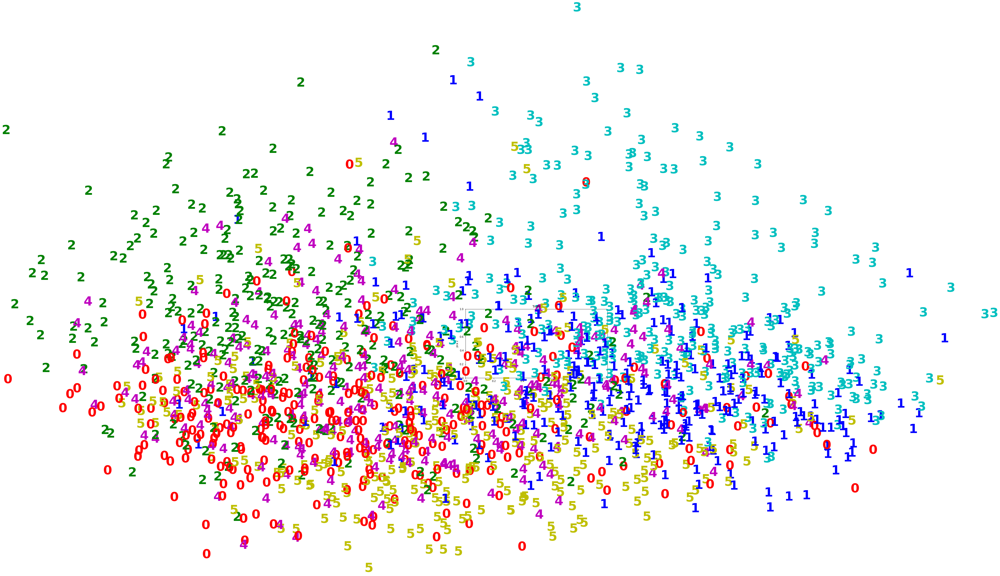

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[y[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Truth')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

#### feature plots

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


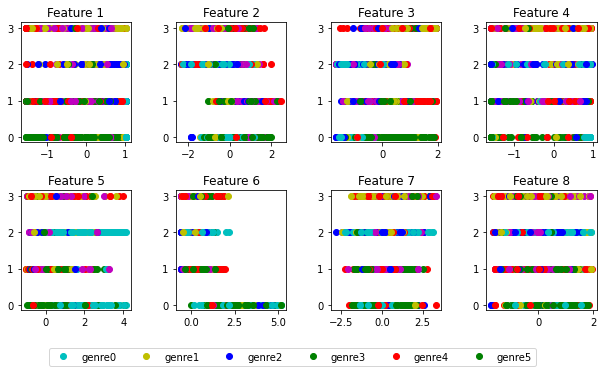

In [ ]:
plt.figure(figsize=(10,5))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

for j in range(X_std.shape[1]):
  for i in range(X_std.shape[0]):
    plt.subplot(2,4,j+1)
    plt.plot(X_std[i,j], y_pred4[i], 'o', color=colour6[y[i]])
    plt.title('Feature {}'.format(j+1))

labels = ['genre0','genre1', 'genre2','genre3','genre4','genre5']
plt.legend(bbox_to_anchor = (0.5, -0.27), labels=labels, ncol=6)
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


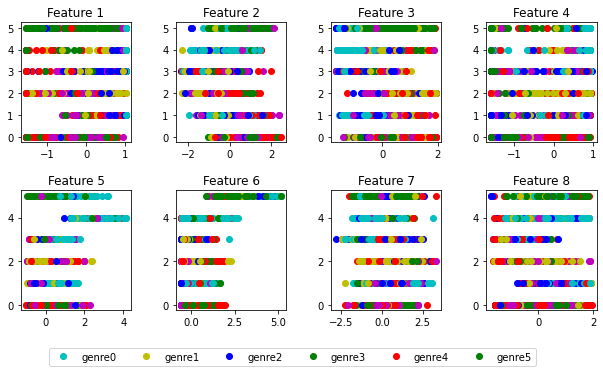

In [ ]:
plt.figure(figsize=(10,5))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

for j in range(X_std.shape[1]):
  for i in range(X_std.shape[0]):
    plt.subplot(2,4,j+1)
    plt.plot(X_std[i,j], y_pred6[i], 'o', color=colour6[y[i]])
    plt.title('Feature {}'.format(j+1))

labels = ['genre0','genre1', 'genre2','genre3','genre4','genre5']
plt.legend(bbox_to_anchor = (0.5, -0.27), labels=labels, ncol=6)
plt.show()

#### histogram labels

In [ ]:
# For ploting
y_df = pd.DataFrame(y, columns=['y'])
counts_y = y_df.value_counts().sort_index()
y_pred4_df = pd.DataFrame(y_pred4)
counts_y_pred4 = y_pred4_df.value_counts().sort_index()
y_pred6_df = pd.DataFrame(y_pred6)
counts_y_pred6 = y_pred6_df.value_counts().sort_index()

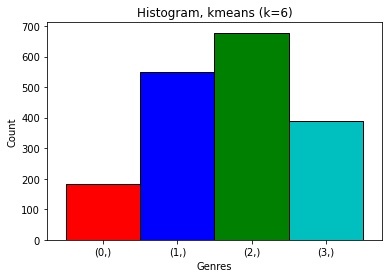

In [ ]:
counts_y_pred4.plot(kind='bar', color=colour6, width=1, rot=0, ec='k')
#plt.axhline(1800/4, color='black')
plt.title('Histogram, kmeans (k=6)')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.show()

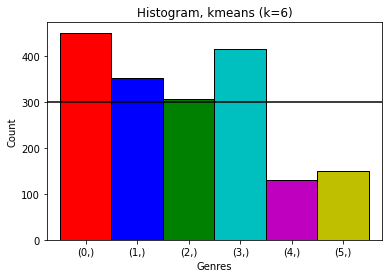

In [ ]:
counts_y_pred6.plot(kind='bar', color=colour6, width=1, rot=0, ec='k')
plt.axhline(300, color='black')
plt.title('Histogram, kmeans (k=6)')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.show()

#### Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    Given a scikit-learn confusion matrix (CM), make a nice plot.

    Arguments
    ---------
    cm:           Confusion matrix from sklearn.metrics.confusion_matrix

    target_names: Given classification classes, such as [0, 1, 2]
                  The class names, for example, ['high', 'medium', 'low']

    title:        The text to display at the top of the matrix

    cmap:         The gradient of the values displayed from matplotlib.pyplot.cm
                  See http://matplotlib.org/examples/color/colormaps_reference.html
                  `plt.get_cmap('jet')` or `plt.cm.Blues`

    normalize:    If `False`, plot the raw numbers
                  If `True`, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # Confusion matrix created by
                                                              # `sklearn.metrics.confusion_matrix`
                          normalize    = True,                # Show proportions
                          target_names = y_labels_vals,       # List of names of the classes
                          title        = best_estimator_name) # Title of graph

    Citation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

In [ ]:
confusion6 = confusion_matrix(y, y_pred6, labels=[0, 1, 2, 3, 4, 5])

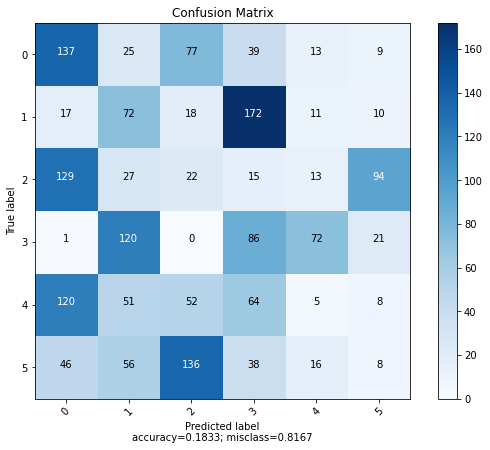

In [ ]:
plot_confusion_matrix(cm=confusion6, target_names = [0, 1, 2, 3, 4, 5], title = 'Confusion Matrix',normalize=False)


## DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

### Parameter Optimization

Parameter Optimization Technique for DBSCAN
-  First, suggested in this [paper (Sanders, 1998)](https://link.springer.com/article/10.1023/A:1009745219419), to start MinPts = 2*dim, where dim is the dimension of your feature set
- Next, optimize epsilon according this [paper (Rahmah, 2012)](https://iopscience.iop.org/article/10.1088/1755-1315/31/1/012012/pdf) by using nearest neighbor technique where `k=MinPts`. Then you plot average k distances and find the optimal value for epsilon at the point of maximum curvature, or at the elbow in the curve.
- Referenced from this [article (Mullin, 2020)](https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd)

In [ ]:
MyMinPts = 16

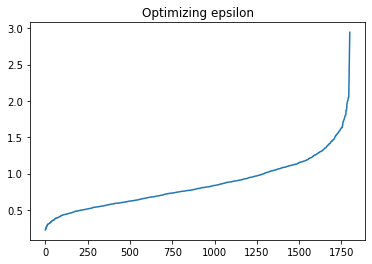

In [ ]:
neighbors = NearestNeighbors(n_neighbors=MyMinPts)
neighbors_fit = neighbors.fit(X_std)
distances, indices = neighbors_fit.kneighbors(X_std)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.title('Optimizing epsilon')
plt.show()

Curve elbow is about at point `epsilon = 1.5`

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1.5, min_samples=MyMinPts)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

In [ ]:
def adjusted_rand_score_dbscan(n_eps, min_samples):
  adjusted_rand_score = []
  eps = np.linspace(1,2,n_eps)
  for i in range(n_eps):
    dbscan_cluster = DBSCAN(eps=eps[i], min_samples=min_samples)
    clusters = dbscan_cluster.fit_predict(X_std)
    adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters))
  d = {'eps':eps, 'adjusted_rand_score':adjusted_rand_score}
  df = pd.DataFrame(d)  
  return(df)

In [ ]:
MinPts16 = adjusted_rand_score_dbscan(9, 16)

In [ ]:
MinPts20 = adjusted_rand_score_dbscan(9, 20)

In [ ]:
MinPts10 = adjusted_rand_score_dbscan(9, 10)

In [ ]:
MinPts5 = adjusted_rand_score_dbscan(9, 5)

Text(0.5, 0.98, 'Parameter Optimization for DBSCAN')

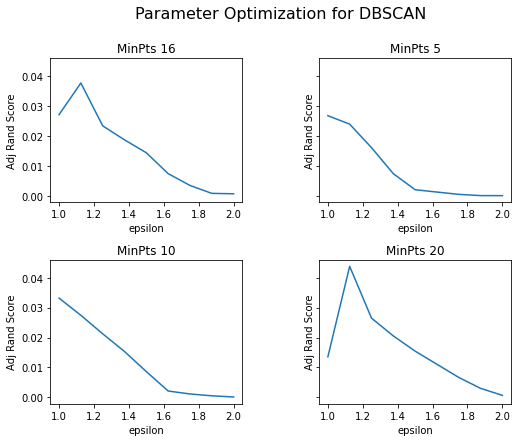

In [ ]:
f, axes = plt.subplots(2, 2, sharey='all', figsize=(8,4))

plt.subplots_adjust(left=0.1,
                    bottom=-0.4, 
                    right=0.9, 
                    top=0.8, 
                    wspace=0.4, 
                    hspace=0.4)

axes[0,0].plot(MinPts16.iloc[:,0], MinPts16.iloc[:,1])
axes[0,0].set_title('MinPts 16')
axes[0,0].set_xlabel('epsilon')
axes[0,0].set_ylabel('Adj Rand Score')

axes[0,1].plot(MinPts5.iloc[:,0], MinPts5.iloc[:,1])
axes[0,1].set_title('MinPts 5')
axes[0,1].set_xlabel('epsilon')
axes[0,1].set_ylabel('Adj Rand Score')

axes[1,0].plot(MinPts10.iloc[:,0], MinPts10.iloc[:,1])
axes[1,0].set_title('MinPts 10')
axes[1,0].set_xlabel('epsilon')
axes[1,0].set_ylabel('Adj Rand Score')

axes[1,1].plot(MinPts20.iloc[:,0], MinPts20.iloc[:,1])
axes[1,1].set_title('MinPts 20')
axes[1,1].set_xlabel('epsilon')
axes[1,1].set_ylabel('Adj Rand Score')

f.suptitle('Parameter Optimization for DBSCAN', fontsize=16)

The maximus Adj Rand Score is for MinPts=20 and a close second is for MinPts=16. I will look closer at the range 16 < MinPts < 20

In [ ]:
MinPts15 = adjusted_rand_score_dbscan(9, 15)

In [ ]:
MinPts18 = adjusted_rand_score_dbscan(9, 17)

In [ ]:
MinPts21 = adjusted_rand_score_dbscan(9, 21)

Text(0.5, 0.98, 'Parameter Optimization for DBSCAN')

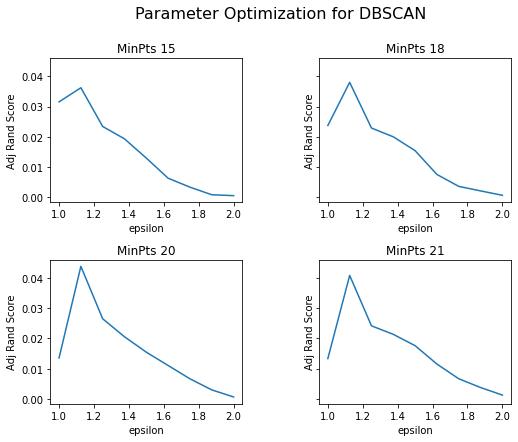

In [ ]:
f, axes = plt.subplots(2, 2, sharey='all', figsize=(8,4))

plt.subplots_adjust(left=0.1,
                    bottom=-0.4, 
                    right=0.9, 
                    top=0.8, 
                    wspace=0.4, 
                    hspace=0.4)

axes[0,0].plot(MinPts15.iloc[:,0], MinPts15.iloc[:,1])
axes[0,0].set_title('MinPts 15')
axes[0,0].set_xlabel('epsilon')
axes[0,0].set_ylabel('Adj Rand Score')

axes[0,1].plot(MinPts18.iloc[:,0], MinPts18.iloc[:,1])
axes[0,1].set_title('MinPts 18')
axes[0,1].set_xlabel('epsilon')
axes[0,1].set_ylabel('Adj Rand Score')

axes[1,0].plot(MinPts20.iloc[:,0], MinPts20.iloc[:,1])
axes[1,0].set_title('MinPts 20')
axes[1,0].set_xlabel('epsilon')
axes[1,0].set_ylabel('Adj Rand Score')

axes[1,1].plot(MinPts21.iloc[:,0], MinPts21.iloc[:,1])
axes[1,1].set_title('MinPts 21')
axes[1,1].set_xlabel('epsilon')
axes[1,1].set_ylabel('Adj Rand Score')

f.suptitle('Parameter Optimization for DBSCAN', fontsize=16)

Will move foward with MinPts=20 and optimize epsilon

In [ ]:
MinPts20 = adjusted_rand_score_dbscan(999, 20)

In [ ]:
adj_rand_score_max = MinPts20['adjusted_rand_score'].max()
max_index = MinPts20['adjusted_rand_score'].idxmax()

In [ ]:
max_eps = MinPts20.loc[max_index,'eps']

### Final Model

In [ ]:
MyMinPts = 20

In [ ]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=max_eps, min_samples=MyMinPts)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

In [ ]:
print("Adjusted Rand Index of the DBSCAN solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))

Adjusted Rand Index of the DBSCAN solution: 0.048136022941176415


In [ ]:
print("The silhouette score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, clusters)))

The silhouette score of the DBSCAN solution: -0.0302753297575438


In [ ]:
silhouette_score = metrics.silhouette_score(X_std, clusters)

In [ ]:
d = {'epsilon': max_eps, 'MinPts': MyMinPts,'Adj rand score': adj_rand_score_max, 'Silhouette score': silhouette_score}

In [ ]:
d

{'Adj rand score': 0.048136022941176415,
 'MinPts': 20,
 'Silhouette score': -0.0302753297575438,
 'epsilon': 1.1492985971943888}

In [ ]:
dbscan_metrics_df = pd.DataFrame(d, index=[0])

In [ ]:
dbscan_metrics_df

,epsilon,MinPts,Adj rand score,Silhouette score
0,1.149299,20,0.048136,-0.030275


In [ ]:
colour4 = ['r','b','g','c']

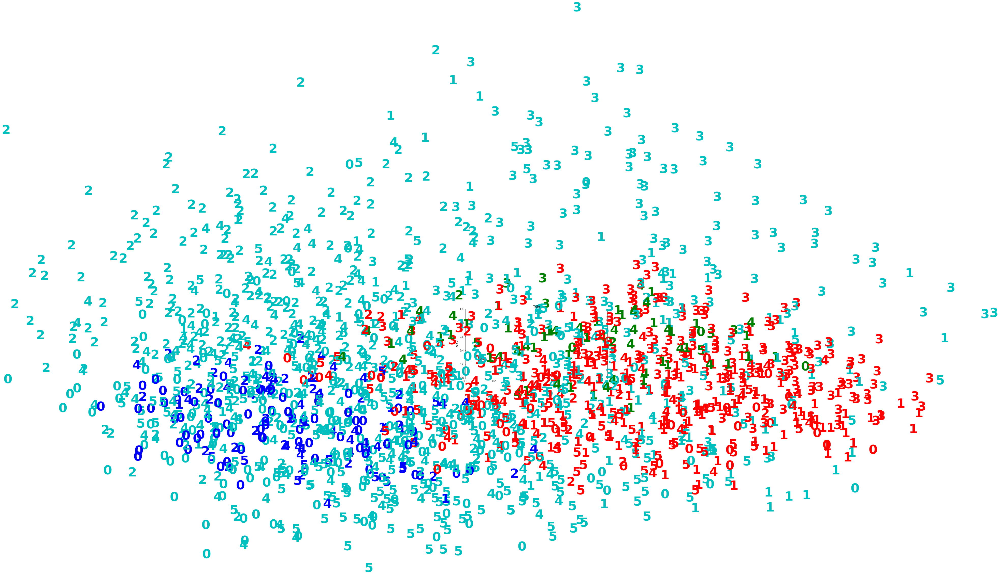

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour4[clusters[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

In [ ]:
# For ploting
clusters_df = pd.DataFrame(clusters)
counts_clusters = clusters_df.value_counts().sort_index()

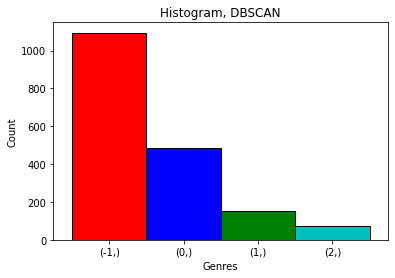

In [ ]:
counts_clusters.plot(kind='bar', color=colour6, width=1, rot=0, ec='k')
plt.title('Histogram, DBSCAN')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':


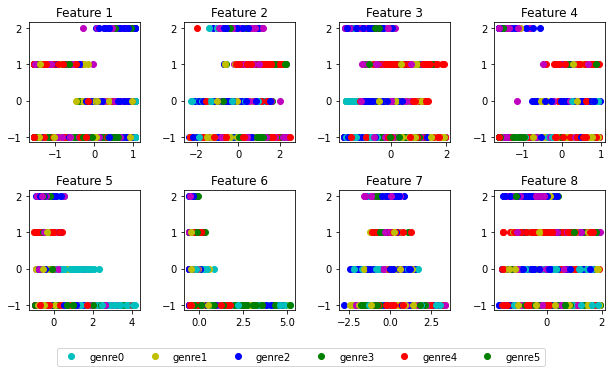

In [ ]:
plt.figure(figsize=(10,5))

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

for j in range(X_std.shape[1]):
  for i in range(X_std.shape[0]):
    plt.subplot(2,4,j+1)
    plt.plot(X_std[i,j], clusters[i], 'o', color=colour6[y[i]])
    plt.title('Feature {}'.format(j+1))

labels = ['genre0','genre1', 'genre2','genre3','genre4','genre5']
plt.legend(bbox_to_anchor = (0.5, -0.27), labels=labels, ncol=6)
plt.show()

### Hierarchical Agglomerative clustering

Similarity metrics in hierarchical clustering
- Agglormerative clustering, for now
-  The three most common metrics of 'distance'
  - Euclidean distance: This is also known as L2 distance (like OLS and k-means)
  - Manhattan distance: This is also known as L1 distance. We used this metric as a regularization term in the Lasso regression.
  - Cosine distance: 
    - good for too many variables and some are insignificant. 
    - Takes into account the shape of the variables more than their values
    - Associate observations that have the same maximum and minimum variables regardless of their values


Linkage Methods    
- how to select the representative elements of the clusters when calculating the similarities
- Ward: 
    - look for spherical clusters 
    - Finds clusters of similar size.
    - only works with Euclidean distance.
- Complete: 
  - links clusters using their furthest observations, (most dissimilar points) 
  - Tend to be comprised of highly similar observations --> resulting groups quite compact

- Average: 
  - Links clusters using their centroids
  - Tends to create larger groups than the complete method. 
  - The clusters can be different sizes and shapes in contrast to the Ward method

In [ ]:
from sklearn.cluster import AgglomerativeClustering

### n_clusters = 6

In [ ]:
### For n_clusters = 6

my_n_clusters = 6

linkage = ['complete', 'average']
affinity = ['l1', 'l2', 'cosine']

agg_cluster = []
clusters = []
link_params = []
aff_params = []

for link, aff in [(link, aff) for link in linkage for aff in affinity]:
  link_params.append(link)
  aff_params.append(aff)
  current_agg_cluster = AgglomerativeClustering(linkage=link,
                                          affinity=aff,
                                         n_clusters=my_n_clusters)
  agg_cluster.append(current_agg_cluster) 
  clusters.append(current_agg_cluster.fit_predict(X_std))

#'ward' linkage only works with euclidian distance, so this is outside loop
current_agg_cluster = AgglomerativeClustering(linkage='ward',
                                         n_clusters=6)
agg_cluster.append(current_agg_cluster) 
clusters.append(current_agg_cluster.fit_predict(X_std))

link_params.append('ward')
aff_params.append('l2')

In [ ]:
n_clusters_list = np.repeat(my_n_clusters, len(agg_cluster))

In [ ]:
silhouette_score = []
adjusted_rand_score = []

for i in range(len(agg_cluster)):
  silhouette_score.append(metrics.silhouette_score(X_std, clusters[i]))
  adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters[i]))

In [ ]:
d6 = {'n_clusters':n_clusters_list,
    'linkage':link_params, 
     'affinity':aff_params, 
     'adj rand score':adjusted_rand_score, 
     'silhouette_score':silhouette_score
     }

In [ ]:
agg_metrics_6_df = pd.DataFrame(d6)

In [ ]:
agg_metrics_6_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,6,complete,l1,0.110559,0.084784
1,6,complete,l2,0.033878,0.060792
2,6,complete,cosine,0.085053,0.068554
3,6,average,l1,0.000433,0.181649
4,6,average,l2,0.017180,0.128697
5,6,average,cosine,0.149215,0.104076
6,6,ward,l2,0.123028,0.122670


- Max Adjusted Random Score for linkage=average and affinity=cosine

### n_clusters = 4

In [ ]:
### For n_clusters = 4

my_n_clusters = 4

linkage = ['complete', 'average']
affinity = ['l1', 'l2', 'cosine']

agg_cluster = []
clusters = []
link_params = []
aff_params = []

for link, aff in [(link, aff) for link in linkage for aff in affinity]:
  link_params.append(link)
  aff_params.append(aff)
  current_agg_cluster = AgglomerativeClustering(linkage=link,
                                          affinity=aff,
                                         n_clusters=my_n_clusters)
  agg_cluster.append(current_agg_cluster) 
  clusters.append(current_agg_cluster.fit_predict(X_std))

#'ward' linkage only works with euclidian distance, so this is outside loop
current_agg_cluster = AgglomerativeClustering(linkage='ward',
                                         n_clusters=6)
agg_cluster.append(current_agg_cluster) 
clusters.append(current_agg_cluster.fit_predict(X_std))

link_params.append('ward')
aff_params.append('l2')

In [ ]:
n_clusters_list = np.repeat(my_n_clusters, len(agg_cluster))

In [ ]:
silhouette_score = []
adjusted_rand_score = []

for i in range(len(agg_cluster)):
  silhouette_score.append(metrics.silhouette_score(X_std, clusters[i]))
  adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters[i]))

In [ ]:
d4 = {'n_clusters':n_clusters_list,
    'linkage':link_params, 
     'affinity':aff_params, 
     'adj rand score':adjusted_rand_score, 
     'silhouette_score':silhouette_score
     }

In [ ]:
agg_metrics_4_df = pd.DataFrame(d4)

In [ ]:
agg_metrics_4_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,4,complete,l1,0.114244,0.090993
1,4,complete,l2,0.010271,0.076372
2,4,complete,cosine,0.085924,0.104178
3,4,average,l1,0.000008,0.224593
4,4,average,l2,0.003182,0.165085
5,4,average,cosine,0.134488,0.130742
6,4,ward,l2,0.123028,0.122670


### n_clusters = 3

In [ ]:
### For n_clusters = 3

my_n_clusters = 3

linkage = ['complete', 'average']
affinity = ['l1', 'l2', 'cosine']

agg_cluster = []
clusters = []
link_params = []
aff_params = []

for link, aff in [(link, aff) for link in linkage for aff in affinity]:
  link_params.append(link)
  aff_params.append(aff)
  current_agg_cluster = AgglomerativeClustering(linkage=link,
                                          affinity=aff,
                                         n_clusters=my_n_clusters)
  agg_cluster.append(current_agg_cluster) 
  clusters.append(current_agg_cluster.fit_predict(X_std))

#'ward' linkage only works with euclidian distance, so this is outside loop
current_agg_cluster = AgglomerativeClustering(linkage='ward',
                                         n_clusters=6)
agg_cluster.append(current_agg_cluster) 
clusters.append(current_agg_cluster.fit_predict(X_std))

link_params.append('ward')
aff_params.append('l2')

In [ ]:
n_clusters_list = np.repeat(my_n_clusters, len(agg_cluster))

In [ ]:
silhouette_score = []
adjusted_rand_score = []

for i in range(len(agg_cluster)):
  silhouette_score.append(metrics.silhouette_score(X_std, clusters[i]))
  adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters[i]))

In [ ]:
d3 = {'n_clusters':n_clusters_list,
    'linkage':link_params, 
     'affinity':aff_params, 
     'adj rand score':adjusted_rand_score, 
     'silhouette_score':silhouette_score
     }

In [ ]:
agg_metrics_3_df = pd.DataFrame(d3)

### n_clusters = 5

In [ ]:
### For n_clusters = 5

my_n_clusters = 5

linkage = ['complete', 'average']
affinity = ['l1', 'l2', 'cosine']

agg_cluster = []
clusters = []
link_params = []
aff_params = []

for link, aff in [(link, aff) for link in linkage for aff in affinity]:
  link_params.append(link)
  aff_params.append(aff)
  current_agg_cluster = AgglomerativeClustering(linkage=link,
                                          affinity=aff,
                                         n_clusters=my_n_clusters)
  agg_cluster.append(current_agg_cluster) 
  clusters.append(current_agg_cluster.fit_predict(X_std))

#'ward' linkage only works with euclidian distance, so this is outside loop
current_agg_cluster = AgglomerativeClustering(linkage='ward',
                                         n_clusters=6)
agg_cluster.append(current_agg_cluster) 
clusters.append(current_agg_cluster.fit_predict(X_std))

link_params.append('ward')
aff_params.append('l2')

In [ ]:
n_clusters_list = np.repeat(my_n_clusters, len(agg_cluster))

In [ ]:
silhouette_score = []
adjusted_rand_score = []

for i in range(len(agg_cluster)):
  silhouette_score.append(metrics.silhouette_score(X_std, clusters[i]))
  adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters[i]))

In [ ]:
d5 = {'n_clusters':n_clusters_list,
    'linkage':link_params, 
     'affinity':aff_params, 
     'adj rand score':adjusted_rand_score, 
     'silhouette_score':silhouette_score
     }

In [ ]:
agg_metrics_5_df = pd.DataFrame(d5)

### n_clusters = 7

In [ ]:
### For n_clusters = 7

my_n_clusters = 7

linkage = ['complete', 'average']
affinity = ['l1', 'l2', 'cosine']

agg_cluster = []
clusters = []
link_params = []
aff_params = []

for link, aff in [(link, aff) for link in linkage for aff in affinity]:
  link_params.append(link)
  aff_params.append(aff)
  current_agg_cluster = AgglomerativeClustering(linkage=link,
                                          affinity=aff,
                                         n_clusters=my_n_clusters)
  agg_cluster.append(current_agg_cluster) 
  clusters.append(current_agg_cluster.fit_predict(X_std))

#'ward' linkage only works with euclidian distance, so this is outside loop
current_agg_cluster = AgglomerativeClustering(linkage='ward',
                                         n_clusters=6)
agg_cluster.append(current_agg_cluster) 
clusters.append(current_agg_cluster.fit_predict(X_std))

link_params.append('ward')
aff_params.append('l2')

In [ ]:
n_clusters_list = np.repeat(my_n_clusters, len(agg_cluster))

In [ ]:
silhouette_score = []
adjusted_rand_score = []

for i in range(len(agg_cluster)):
  silhouette_score.append(metrics.silhouette_score(X_std, clusters[i]))
  adjusted_rand_score.append(metrics.adjusted_rand_score(y, clusters[i]))

In [ ]:
d7 = {'n_clusters':n_clusters_list,
    'linkage':link_params, 
     'affinity':aff_params, 
     'adj rand score':adjusted_rand_score, 
     'silhouette_score':silhouette_score
     }

In [ ]:
agg_metrics_7_df = pd.DataFrame(d7)

### Comparison for different n_clusters 

In [ ]:
agg_metrics_3_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,3,complete,l1,0.120863,0.091668
1,3,complete,l2,0.003105,0.054943
2,3,complete,cosine,0.074948,0.097034
3,3,average,l1,0.000002,0.291656
4,3,average,l2,0.000555,0.195056
5,3,average,cosine,0.126662,0.114646
6,3,ward,l2,0.123028,0.122670


In [ ]:
agg_metrics_4_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,4,complete,l1,0.114244,0.090993
1,4,complete,l2,0.010271,0.076372
2,4,complete,cosine,0.085924,0.104178
3,4,average,l1,0.000008,0.224593
4,4,average,l2,0.003182,0.165085
5,4,average,cosine,0.134488,0.130742
6,4,ward,l2,0.123028,0.122670


In [ ]:
agg_metrics_5_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,5,complete,l1,0.114514,0.084601
1,5,complete,l2,0.032059,0.091445
2,5,complete,cosine,0.083607,0.095580
3,5,average,l1,0.000453,0.227114
4,5,average,l2,0.017281,0.161392
5,5,average,cosine,0.136071,0.100522
6,5,ward,l2,0.123028,0.122670


In [ ]:
agg_metrics_6_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,6,complete,l1,0.110559,0.084784
1,6,complete,l2,0.033878,0.060792
2,6,complete,cosine,0.085053,0.068554
3,6,average,l1,0.000433,0.181649
4,6,average,l2,0.017180,0.128697
5,6,average,cosine,0.149215,0.104076
6,6,ward,l2,0.123028,0.122670


In [ ]:
agg_metrics_7_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,7,complete,l1,0.102268,0.085715
1,7,complete,l2,0.035079,0.058274
2,7,complete,cosine,0.086333,0.088837
3,7,average,l1,0.004709,0.171080
4,7,average,l2,0.017742,0.119136
5,7,average,cosine,0.166939,0.117248
6,7,ward,l2,0.123028,0.122670


Max Adjusted Rand Score for n_clusters=7, but I would be concerned of overfitting

I will consider two models:
- n_clusters=6, linkage='average', affinity='l1'
- n_clusters=4, linkage='average', affinity='l1'



### Model Selection

In [ ]:
# Defining the agglomerative clustering
agg_cluster_6 = AgglomerativeClustering(linkage='average', 
                                      affinity='l1',
                                      n_clusters=6)

# Fit model
clusters_6 = agg_cluster_6.fit_predict(X_std)

In [ ]:
# Defining the agglomerative clustering
agg_cluster_4 = AgglomerativeClustering(linkage='average', 
                                      affinity='l1',
                                      n_clusters=4)

# Fit model
clusters_4 = agg_cluster_4.fit_predict(X_std)

In [ ]:
clusters_4[clusters_4==1]

array([1, 1])

In [ ]:
agg_cluster_4.n_clusters_

4

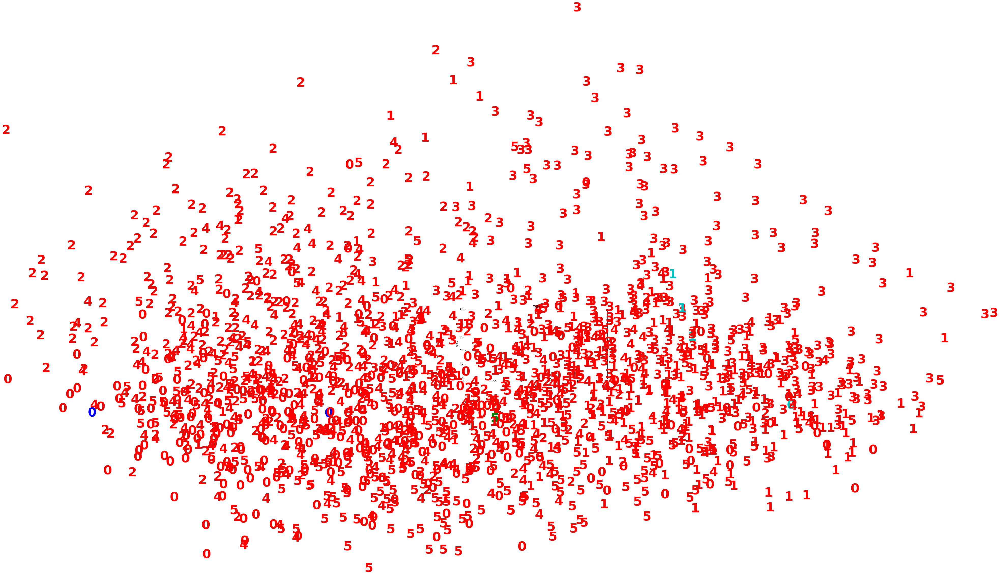

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour4[clusters_4[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

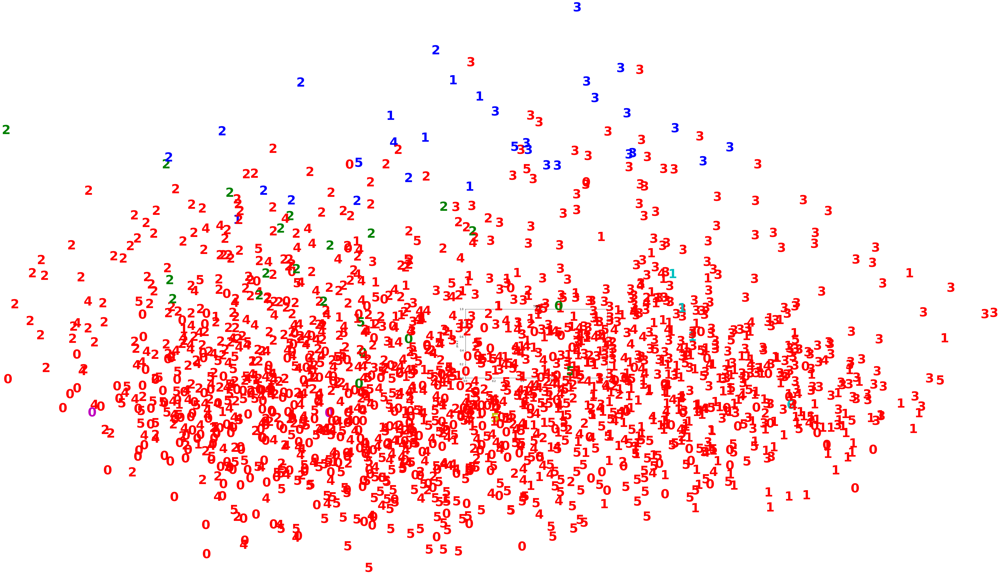

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[clusters_6[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

I know that cosine linkage can create big groups. These groups are so large that they are unhelpful.

I will look at ward method

In [ ]:
# Defining the agglomerative clustering
agg_cluster_6 = AgglomerativeClustering(linkage='ward', 
                                      n_clusters=6)

# Fit model
clusters_6 = agg_cluster_6.fit_predict(X_std)

In [ ]:
# Defining the agglomerative clustering
agg_cluster_4 = AgglomerativeClustering(linkage='ward', 
                                      n_clusters=4)

# Fit model
clusters_4 = agg_cluster_4.fit_predict(X_std)

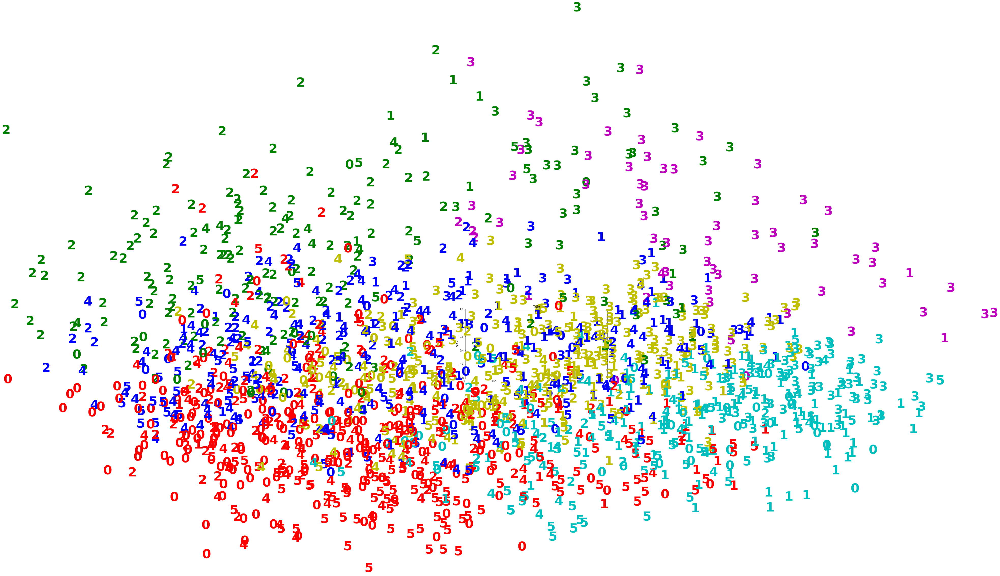

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[clusters_6[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

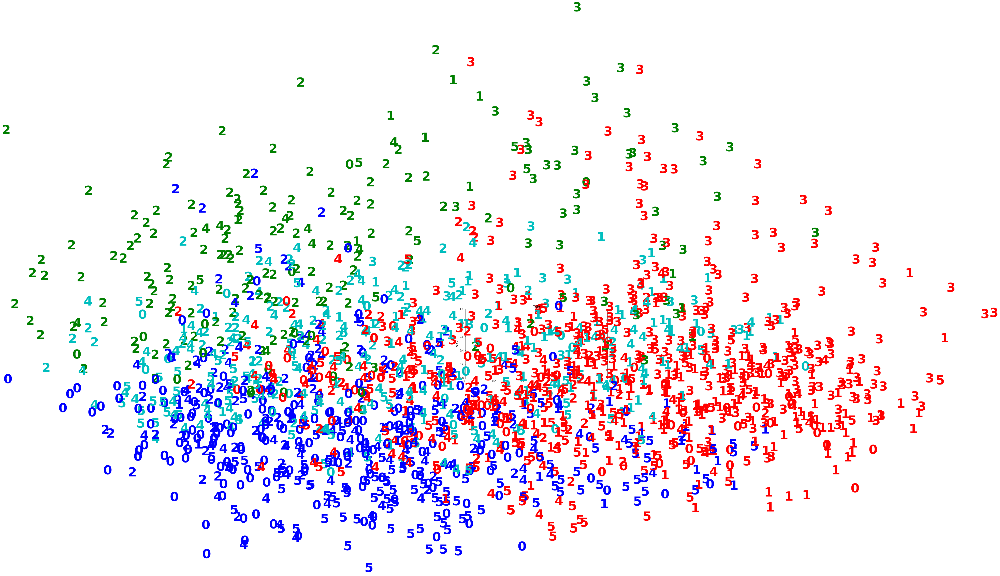

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour4[clusters_4[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

I will look at
- linkage='complete'
- affinity='l1' 
- n_clusters = 4 and 6

In [ ]:
# Defining the agglomerative clustering
agg_cluster_6 = AgglomerativeClustering(linkage='complete', 
                                        affinity='l1',
                                        n_clusters=6)
# Fit model
clusters_6 = agg_cluster_6.fit_predict(X_std)

In [ ]:
# Defining the agglomerative clustering
agg_cluster_4 = AgglomerativeClustering(linkage='complete', 
                                        affinity='l1',
                                        n_clusters=4)
# Fit model
clusters_4 = agg_cluster_4.fit_predict(X_std)

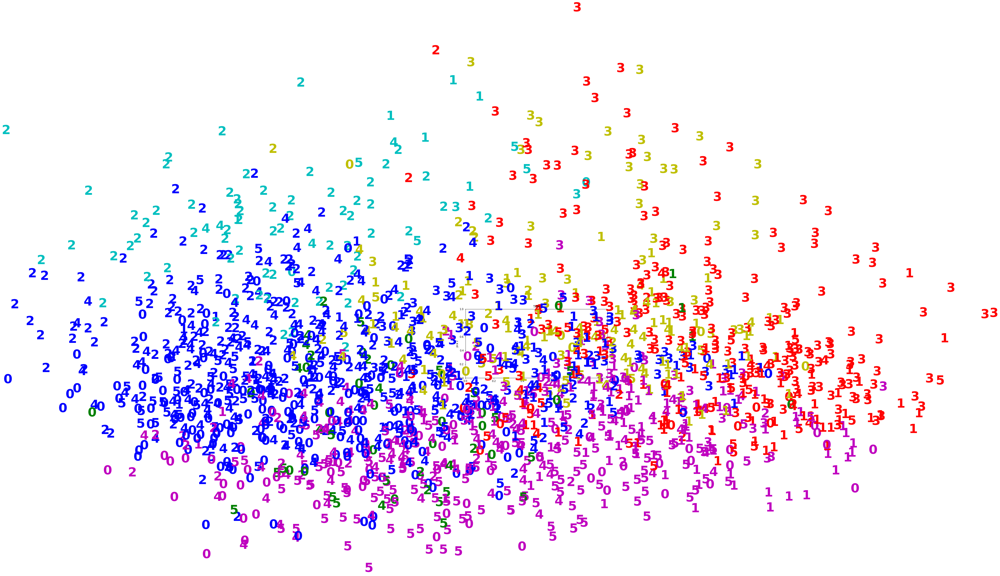

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[clusters_6[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

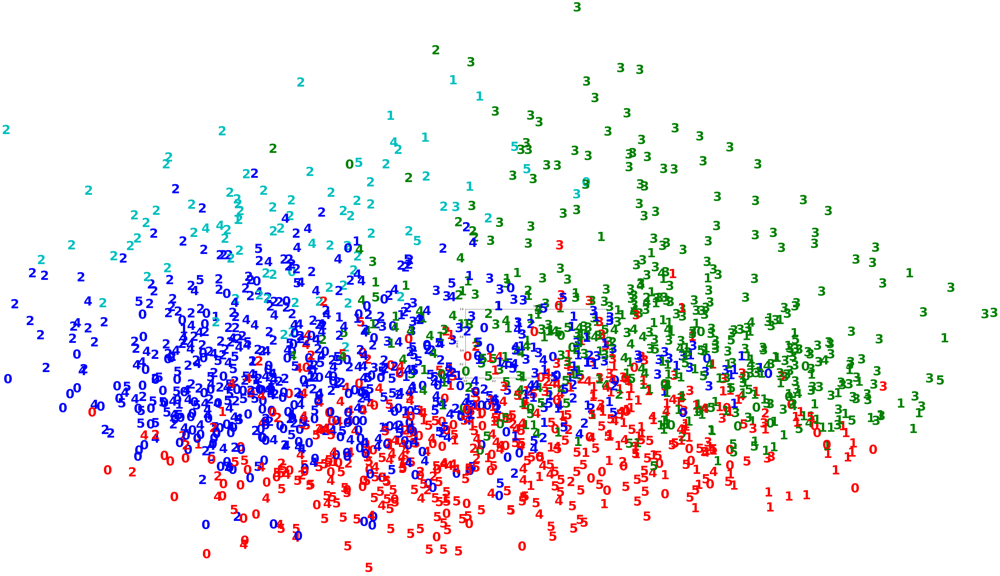

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour4[clusters_4[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

In [ ]:
agg_metrics_4_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,4,complete,l1,0.114244,0.090993
1,4,complete,l2,0.010271,0.076372
2,4,complete,cosine,0.085924,0.104178
3,4,average,l1,0.000008,0.224593
4,4,average,l2,0.003182,0.165085
5,4,average,cosine,0.134488,0.130742
6,4,ward,l2,0.123028,0.122670


In [ ]:
agg_metrics_6_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
0,6,complete,l1,0.110559,0.084784
1,6,complete,l2,0.033878,0.060792
2,6,complete,cosine,0.085053,0.068554
3,6,average,l1,0.000433,0.181649
4,6,average,l2,0.017180,0.128697
5,6,average,cosine,0.149215,0.104076
6,6,ward,l2,0.123028,0.122670


In [ ]:
final_agg_metrics_df = pd.concat([agg_metrics_4_df[-1:], 
                                  agg_metrics_6_df[-1:], 
                                  agg_metrics_6_df[0:1], 
                                  agg_metrics_4_df[0:1]],
                                  axis=0
                                  )

In [ ]:
final_agg_metrics_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
6,4,ward,l2,0.123028,0.122670
6,6,ward,l2,0.123028,0.122670
0,6,complete,l1,0.110559,0.084784
0,4,complete,l1,0.114244,0.090993


## Comparison of Algorithms

Models of consideration:
- Kmeans
  - n_clusters
    - 4 and 6
- Hierarchical Agglomerative Clustering
  - linkage = ward
  - affinity = l2 (euclidean)
  - n_clussters = 4 and 6 
- Hierarchical Agglomerative Clustering
  - linkage='complete'
  - affinity='l1' 
  - n_clusters = 4 and 6

In [ ]:
kmeans_metrics_df

,k clusters,Adj Rand Score,Silhouette Score
0,2,0.137194,0.178800
1,3,0.129334,0.186411
2,4,0.147751,0.163144
3,5,0.136336,0.163901
4,6,0.126349,0.159080
5,7,0.137943,0.165175
6,8,0.132911,0.168284
7,9,0.118278,0.166251


In [ ]:
dbscan_metrics_df

,epsilon,MinPts,Adj rand score,Silhouette score
0,1.149299,20,0.048136,-0.030275


In [ ]:
final_agg_metrics_df

,n_clusters,linkage,affinity,adj rand score,silhouette_score
6,4,ward,l2,0.123028,0.122670
6,6,ward,l2,0.123028,0.122670
0,6,complete,l1,0.110559,0.084784
0,4,complete,l1,0.114244,0.090993


## Further Explore K-means by each genre

In [ ]:
#n_clusters=4
kmeans_cluster4 = KMeans(n_clusters=4, random_state=my_random_state)
kmeans_cluster4.fit(X_std)
y_pred4 = kmeans_cluster4.predict(X_std)

In [ ]:
#n_clusters=6
kmeans_cluster6 = KMeans(n_clusters=6, random_state=my_random_state)
kmeans_cluster6.fit(X_std)
y_pred6 = kmeans_cluster6.predict(X_std)

In [ ]:
colour4 = ['r','b','g','c']

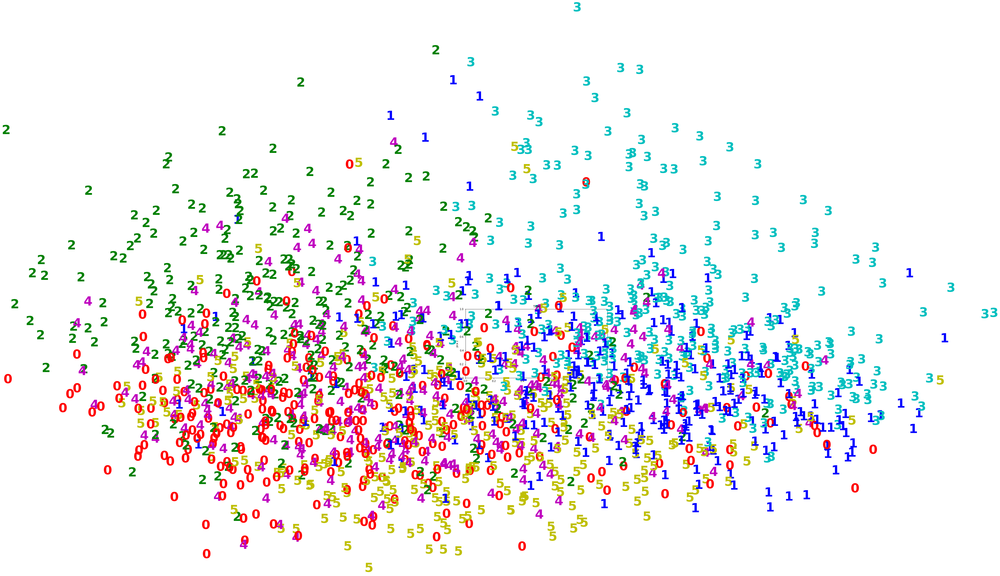

In [ ]:
plt.figure(figsize=(10,5))
for i in range(pca_fit.shape[0]):
  plt.text(pca_fit[i,0], pca_fit[i,1], str(y[i]),
            color=colour6[y[i]], 
            fontdict={'weight': 'bold', 'size': 50}
          )
#plt.xticks([])
#plt.yticks([])
#plt.axis('off')
plt.title('Title')
plt.xlabel('pca 1')
plt.ylabel('pca 2')
plt.show()

In [ ]:
pca_fit[0]

array([2.03375211, 0.08268935])

In [ ]:
pca_fit_df = pd.DataFrame(pca_fit, columns=['pca0','pca1'])

In [ ]:
y_df = pd.DataFrame(y, columns=['y'])

In [ ]:
y_pred4_df = pd.DataFrame(y_pred4, columns=['y_pred4'])
y_pred6_df = pd.DataFrame(y_pred6, columns=['y_pred6'])

In [ ]:
df_plot = pd.concat([y_df, y_pred4_df, y_pred6_df, pca_fit_df], axis=1)

In [ ]:
df_plot.head()

,y,y_pred4,y_pred6,pca0,pca1
0,3,2,3,2.033752,0.082689
1,5,3,2,-1.358704,-1.431642
2,1,2,3,1.834185,-1.453442
3,2,2,3,0.517548,-0.929406
4,0,1,0,-0.782301,0.861652


In [ ]:
genre0_df = df_plot.iloc[y==0]
genre1_df = df_plot.iloc[y==1]
genre2_df = df_plot.iloc[y==2]
genre3_df = df_plot.iloc[y==3]
genre4_df = df_plot.iloc[y==4]
genre5_df = df_plot.iloc[y==5]

Key for Ordinal Encoder:
0. Electronic
1. Folk
2. Hip-Hop
3. Old-Time / Historic
4. Pop
5. Rock

In [ ]:
colour4

['r', 'b', 'g', 'c']

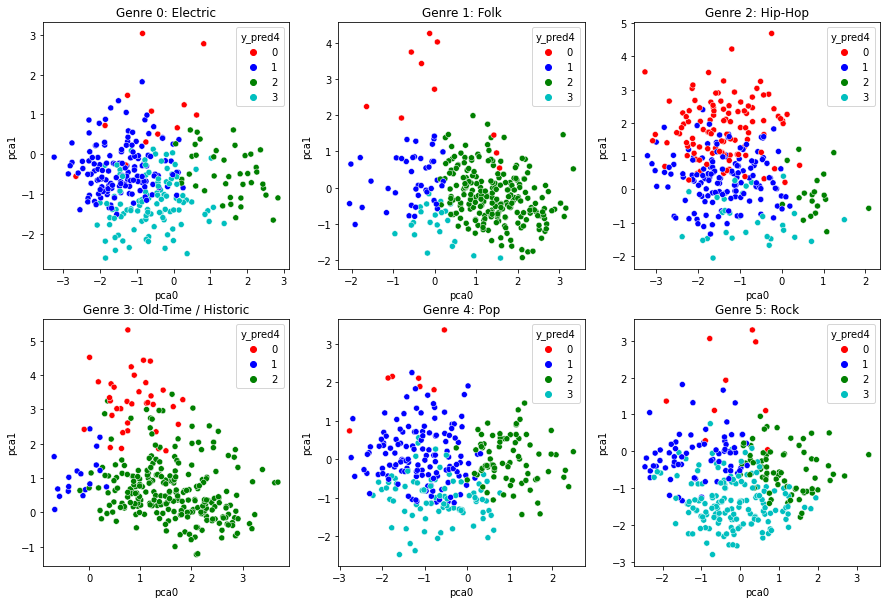

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(2,3,1)
sns.scatterplot(data=genre0_df, x='pca0', y='pca1', hue='y_pred4', palette=colour4)
plt.title('Genre 0: Electric')

plt.subplot(2,3,2)
sns.scatterplot(data=genre1_df, x='pca0', y='pca1', hue='y_pred4', palette=colour4)
plt.title('Genre 1: Folk')

plt.subplot(2,3,3)
sns.scatterplot(data=genre2_df, x='pca0', y='pca1', hue='y_pred4', palette=colour4)
plt.title('Genre 2: Hip-Hop')

plt.subplot(2,3,4)
sns.scatterplot(data=genre3_df, x='pca0', y='pca1', hue='y_pred4', palette=['r', 'b', 'g'])
plt.title('Genre 3: Old-Time / Historic')

plt.subplot(2,3,5)
sns.scatterplot(data=genre4_df, x='pca0', y='pca1', hue='y_pred4', palette=colour4)
plt.title('Genre 4: Pop')

plt.subplot(2,3,6)
sns.scatterplot(data=genre5_df, x='pca0', y='pca1', hue='y_pred4', palette=colour4)
plt.title('Genre 5: Rock')

plt.show()

- genre 1 (Folk) and 3 (Old-Time) are commonly both labeled 2
- genre 5 (Rock) and (Electric) and Pop" have similar labeled structure
- genre 2 (Hip-Hop) have most of labeled 0, with some in genre 3 (Old-Time)
- Historic has no label 3
- Hip-hop similar to Electric, Pop, and Rock, with exception to label 0 (red), which is dominated in Hip-hop genre

In [ ]:
colour6

['r', 'b', 'g', 'c', 'm', 'y']

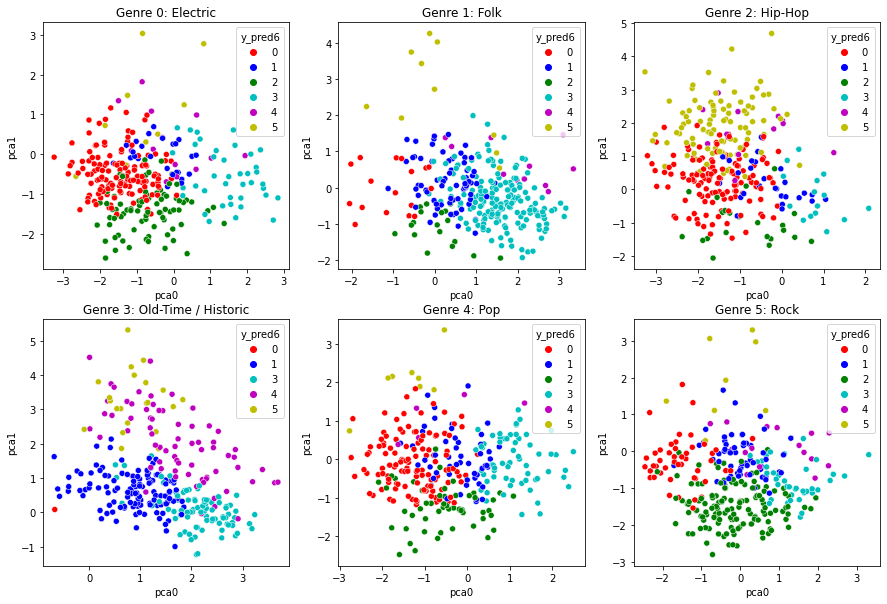

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(2,3,1)
sns.scatterplot(data=genre0_df, x='pca0', y='pca1', hue='y_pred6', palette=colour6)
plt.title('Genre 0: Electric')

plt.subplot(2,3,2)
sns.scatterplot(data=genre1_df, x='pca0', y='pca1', hue='y_pred6', palette=colour6)
plt.title('Genre 1: Folk')

plt.subplot(2,3,3)
sns.scatterplot(data=genre2_df, x='pca0', y='pca1', hue='y_pred6', palette=colour6)
plt.title('Genre 2: Hip-Hop')

plt.subplot(2,3,4)
sns.scatterplot(data=genre3_df, x='pca0', y='pca1', hue='y_pred6', palette=['r', 'b', 'c', 'm', 'y'])
plt.title('Genre 3: Old-Time / Historic')

plt.subplot(2,3,5)
sns.scatterplot(data=genre4_df, x='pca0', y='pca1', hue='y_pred6', palette=colour6)
plt.title('Genre 4: Pop')

plt.subplot(2,3,6)
sns.scatterplot(data=genre5_df, x='pca0', y='pca1', hue='y_pred6', palette=colour6)
plt.title('Genre 5: Rock')

plt.show()

- Most similarly labeled genres are 0 (Electric) and 4 (Pop) 
  - Electric Music and Pop Music similar
- Electric, Rock, and Pop dominate label 2 (green)
  - Historic has no 2 (green) labels
- Purple (label 4) is mostly Historic 
- Historic genre looks most differently labeled compared to other genres 
  - Most unique genre may be Historic
- Pop and Electric very similar (again)
- Hip hop similar to Pop and Electric, with exception to label 5 (yellow)

Overall:
- Electric and Pop very similarly labeled
- Folk and Historic similarly labeled
- Historic most uniquely identified genre
  - has n-1 labels in both algorithms
- Rock, Electric, Pop, and Hip-hop similarly labeled
  - with exception of Hip-hop containing unique label (red)

Reccomendations:
- more features to specifically identify differences in Electric and Pop 
- For ML reccomendations on Spotify, Historic is most unlike other genres
  - perhaps less likely to be reccomended
- Label with most in Hip-hop is likely to be hip-hop. Can be fairly confident that it is indeed Hip-hop
  - increase confidence in Hip-hop ML reccomendations